Step1. 검증용 데이터셋 준비

In [12]:
import cv2
import os
import matplotlib.pyplot as plt
from glob import glob

In [13]:

path = os.getenv("HOME")+"/aiffel/ocr_python/"
image_list = (glob(image_path+'note1*.jpg'))
def search(image_list):

    for image in image_list:
        print(image)
        img = cv2.imread(image, cv2.IMREAD_COLOR)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()
    return f_list
search(image_path)

NameError: name 'image_path' is not defined

Step2. Google OCR API, keras-ocr, Tesseract로 테스트 진행

### Google API

In [1]:
def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
        print('\n"{}"'.format(text.description))

    vertices = (['({},{})'.format(vertex.x, vertex.y)
                 for vertex in text.bounding_poly.vertices])

    print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))

In [7]:
# 다운받은 인증키 경로가 정확하게 지정되어 있어야 합니다. 
!ls -l $GOOGLE_APPLICATION_CREDENTIALS

import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/my_google_api_key.json'

# 입력 이미지 경로를 지정해 주세요.
# (예시) path = os.getenv('HOME')+'/aiffel/ocr_python/test_image.png'
path = os.getenv('HOME')+'/aiffel/ocr_python/note0.jpg'
print(path)
# 위에서 정의한 OCR API 이용 함수를 호출해 봅시다.
path = 1
detect_text(path)

-rw-rw-r-- 1 aiffel-dj62 aiffel-dj62 2359  3월 22 22:32 /home/aiffel-dj62/aiffel/ocr_python/my_google_api_key.json
/home/aiffel-dj62/aiffel/ocr_python/note0.jpg


TypeError: with_scopes_if_required() got an unexpected keyword argument 'default_scopes'

### KERAS

In [2]:
import matplotlib.pyplot as plt
import keras_ocr
from glob import glob
import os
# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드받게 됩니다. 
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /home/aiffel-dj62/.keras-ocr/craft_mlt_25k.h5
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Looking for /home/aiffel-dj62/.keras-ocr/crnn_kurapan.h5


In [3]:
print(len(image_list))
print(image_list)
images = [ keras_ocr.tools.read(image) for image in image_list]
prediction_groups = [pipeline.recognize([image]) for image in image_list]
# print(images)


8
['/home/aiffel-dj62/aiffel/ocr_python/note1.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note14.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note11.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note13.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note12.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note15.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note10.jpg', '/home/aiffel-dj62/aiffel/ocr_python/note16.jpg']


/home/aiffel-dj62/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


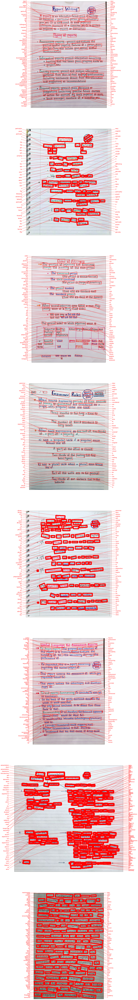

In [4]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(200, 200))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

### Tesseract OCR

In [6]:
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

def crop_word_regions(image_path='./images/sample.png', output_path='/output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='eng',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
#             print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list


work_dir = os.getenv('HOME')+'/aiffel/ocr_python'
img_file_path = work_dir + '/note1.jpg'   #테스트용 이미지 경로입니다. 본인이 선택한 파일명으로 바꿔주세요. 

cropped_image_path_list = crop_word_regions(img_file_path, work_dir+'/output')

In [7]:
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='eng',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")

# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
recognize_images(cropped_image_path_list)


Migport


eo ar ia al

oe

I es i fe.

tee

_A report is

is

-

arr

mormativ

Formal

Sl rE

piece C


ot

weitin

me GD CeC nS.

()

particular _person

a

, sitvuat

Plan, etc.

\

awe

addressed

TO

one’s

Su


ercior

|

<r ecses S


olleqque

members

Pee eee ae : a i

————_1n_fespons:


2 To a feo

uestT

CT

EE

Mt ee

©

a=?

resen

CVO\IATEC

We

ee rrr

(ess)

ee es

OOO

sy or iwmstfructfion. se ae


sss LC CL LLL LLL LL LLL



I cermemnicarninnren eign a ai cece aay a acerca enna apatites etapa gaa eI LTE LT a Re Te as | ey ee a eee ee ee ee eee ee

C)

Nil INViOLmMmMaryi

OynCe

CA

On

ha

eC.

lo |

.—

A

project

ee

CH

>

On»

ANoa

Y¥\

YY)

eae

ene eed

-do

UCPSTIONNAINIL

Conc

Or

YY \

|

1iOoy})

Li

1

C)

YY)

Done


In [ ]:
### 

Step3. 테스트 결과 정리

Step4. 결과 분석과 결론 제시

이미지를 크게하면 커널이 죽어버립니다 ㅠ